## Sim Demo

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-09-07 18:33:18.303066: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-07 18:33:18.670992: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-07 18:33:20.199911: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
  import numpy.matlib 

In [3]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run)
importlib.reload(models.train_val)
importlib.reload(data.data_utils)


<module 'data.data_utils' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_utils.py'>

#### Check job specs

In [4]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 2.3%
RAM Usage: 3.4%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [5]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


0
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.00 GB


In [6]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |


In [7]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

## Simulation tests <a id="sims"></a>

### Model Parameter Counts

#### **Linear Models**
- **PCA Bilinear:** 730  _(27 PCs)_
- **PLS Bilinear:** 101  _(10 PLS components)_
- **Bilinear Low-rank:** 73,800  _(rank 10)_
- **PLS MLP:** 158,993  _(10 PLS components, including PLS projection matrices)_
- **PCA MLP:** 47,873  _(27 PCs, 2-layer)_

---

#### **MLP and SMT Models**

#### 2-Layer Models
- **MLP:** 3,812,609
- **SMT:** 1,399,947
- **MLP w/ CLS:** 3,814,145
- **SMT w/ CLS:** 1,405,579

#### 3-Layer Models
- **MLP:** 7,723,777
- **SMT:** 2,162,315
- **MLP w/ CLS:** 7,726,849
- **SMT w/ CLS:** 2,173,067

---

### Coord MLP Parameter Counts
- **[32]:** 321
- **[64, 32]:** 2,753
- **[128, 64]:** 9,601
- **[256, 128]:** 35,685
- **[512, 256, 128]:** 169,729

In [17]:
from data.data_load import load_transcriptome, load_coords, load_connectome
# Load data
X = load_transcriptome(parcellation='S456', gene_list='0.2', sort_genes='refgenome', omit_subcortical=False)
coords = load_coords(parcellation='S456', omit_subcortical=False)
Y = load_connectome(parcellation='S456', dataset='UKBB', measure='FC', omit_subcortical=False)

# Remove rows that are all NaN
valid_indices = ~np.isnan(X).all(axis=1)

# Subset data using valid indices
X = X[valid_indices]
coords = coords[valid_indices]
Y = Y[valid_indices][:, valid_indices]

# Compute pairwise distances between coordinates
n_regions = len(coords)
distances = np.zeros((n_regions, n_regions))
for i in range(n_regions):
    for j in range(n_regions):
        distances[i,j] = np.sqrt(np.sum((coords[i] - coords[j])**2))

# Compute Gaussian kernel matrix
sigma = np.median(distances)  # Use median distance as kernel width
gaussian_kernel = np.exp(-distances**2 / (2*sigma**2))


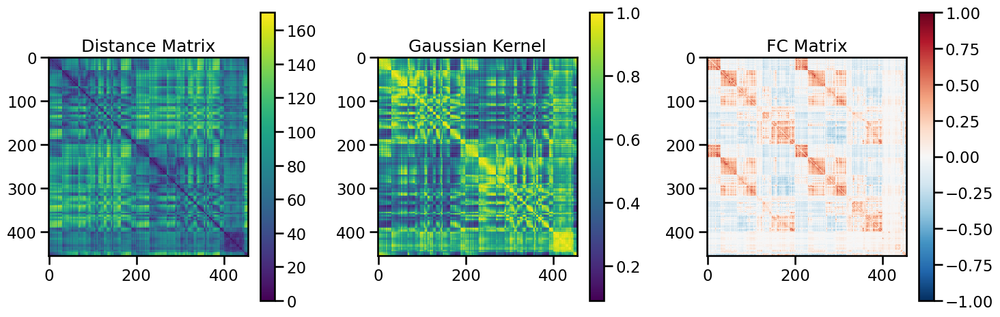

In [18]:
# Plot distance matrix, gaussian kernel, and FC matrix
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot distance matrix
im0 = axes[0].imshow(distances, cmap='viridis')
axes[0].set_title('Distance Matrix')
plt.colorbar(im0, ax=axes[0])

# Plot gaussian kernel matrix 
im1 = axes[1].imshow(gaussian_kernel, cmap='viridis')
axes[1].set_title('Gaussian Kernel')
plt.colorbar(im1, ax=axes[1])

# Plot FC matrix
im2 = axes[2].imshow(Y, cmap='RdBu_r', vmin=-1, vmax=1)
axes[2].set_title('FC Matrix') 
plt.colorbar(im2, ax=axes[2])

plt.tight_layout()
plt.show()


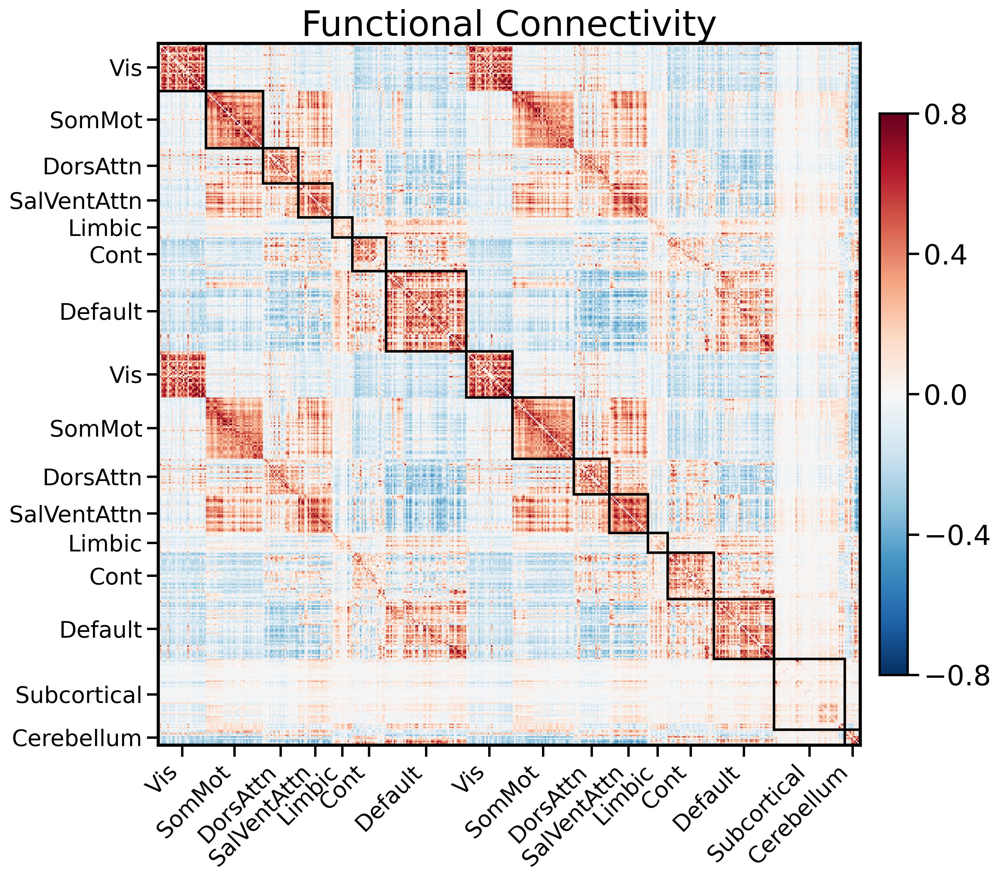

In [21]:
# Import plotting function
from data.data_viz import plot_connectome

# Plot connectome with network labels
plot_connectome(
    parcellation='S456',
    dataset='UKBB', 
    measure='FC',
    omit_subcortical=False,
    add_subnetwork_boxes=True,
    add_subnetwork_labels=True,
    fontsize=24,
    figsize=(12, 10)
)


In [ ]:
# Visual system has high intra and inter-hemispheric spatial proximity - it also has strong connectivity in general
# The CLS token should be very informative here in both the true and null case
# Control on the other hand has diverse connections and spread out distances

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
X_pca_full shape: (455, 455)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: {'Vis': 61, 'SomMot': 77, 'DorsAttn': 46, 'SalVentAttn': 47, 'Limbic': 26, 'Cont': 52, 'Default': 91, 'Subcortical': 46, 'Cerebellum': 9}
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


  return LooseVersion(v) >= LooseVersion(check)

ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: o2osog0b
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/o2osog0b
Initialized sweep with ID: o2osog0b
Testing network: Vis
SomMot
DorsAttn
SalVentAttn
Limbic
Cont
Default
Subcortical
Cerebellum
BEST CONFIG {'input_dim': 14760, 'token_encoder_dim': 60, 'd_model': 128, 'use_alibi': True, 'nhead': 4, 'num_layers': 4, 'deep_hidden_dims': [512, 256, 128], 'cls_init': 'spatial_learned', 'transformer_dropout': 0.1, 'dropout_rate': 0.1, 'learning_rate': 0.0005, 'weight_decay': 1e-05, 'batch_size': 1024, 'aug_prob': 0.0, 'epochs': 11, 'num_workers': 2, 'prefetch_factor': 4}


  warnings.warn(



Number of learnable parameters in SMT w/ CLS pooled model: 1086978
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.00 GB
Best val loss so far at epoch 1: 0.0584
Epoch 5/11, Train Loss: 0.0252, Val Loss: 0.0693, Time: 8.85s
Epoch 10/11, Train Loss: 0.0205, Val Loss: 0.0795, Time: 8.90s

Reached final epoch 11. Restoring best model with Val Loss: 0.0584, Pearson Correlation: 0.5439
Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 394 regions, 154842 connections


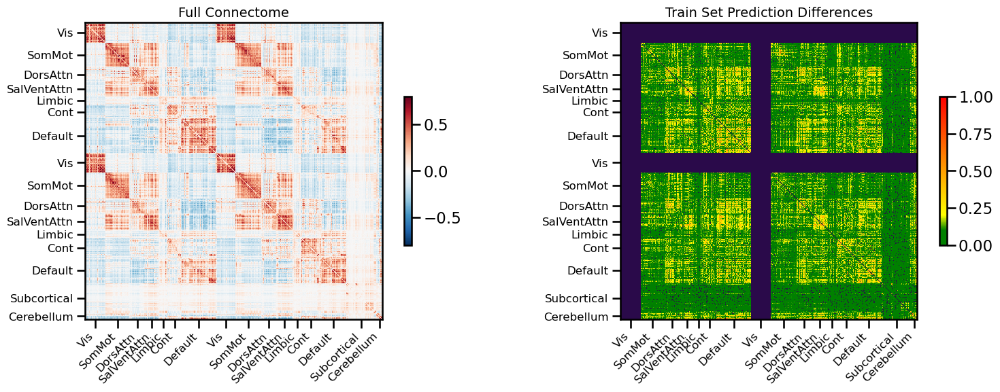

<Figure size 640x480 with 0 Axes>

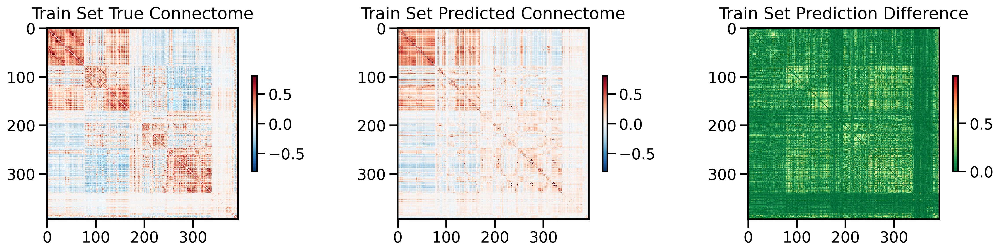

<Figure size 640x480 with 0 Axes>

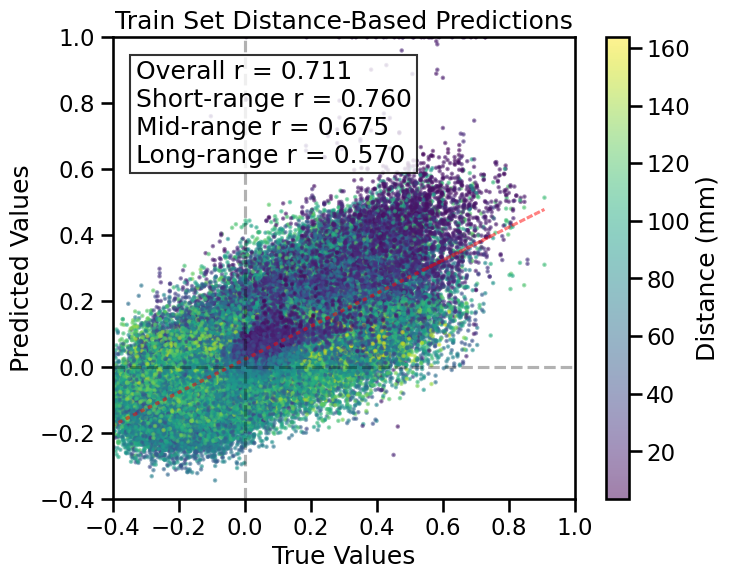

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 61 regions, 3660 connections


<Figure size 640x480 with 0 Axes>

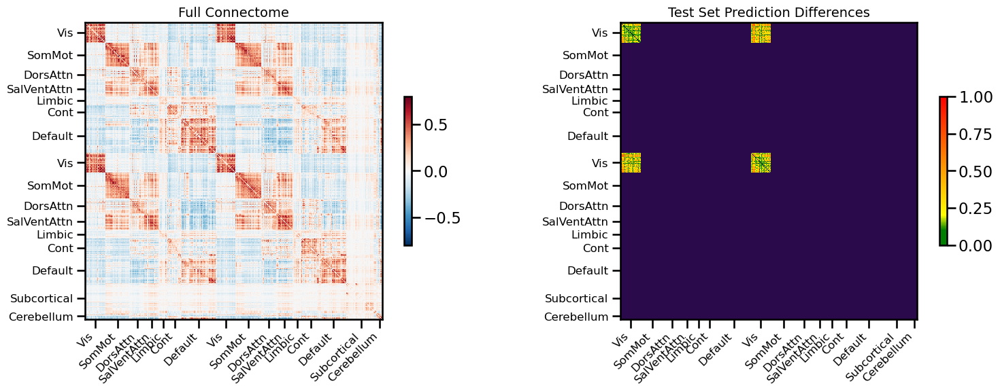

<Figure size 640x480 with 0 Axes>

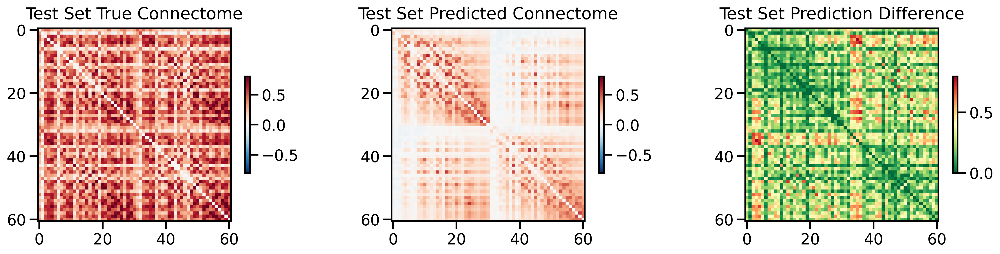

<Figure size 640x480 with 0 Axes>

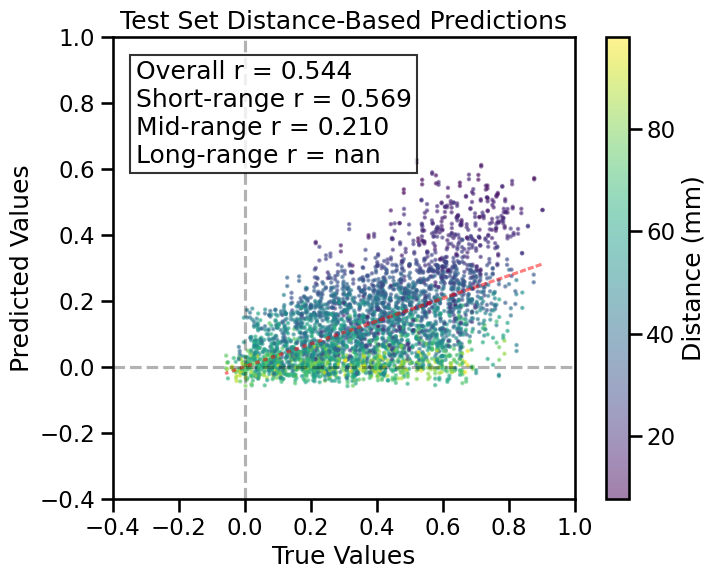

In [ ]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='schaefer',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='shared_transformer_cls_pool',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()

Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 15633)
X_pca shape: (455, 15633)
X_pca_full shape: (455, 15633)
X_cell_types_Jorstad shape: (455, 24)
X_cell_types_LakeDFC shape: (455, 18)
X_cell_types_LakeVIS shape: (455, 18)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: [113, 113, 113, 116]
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


  return LooseVersion(v) >= LooseVersion(check)

ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: dgmerug2
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/dgmerug2
Initialized sweep with ID: dgmerug2
2
3
4
BEST CONFIG {'input_dim': 31266, 'n_components': 128, 'finetune_last_layer': False, 'd_model': 64, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [512, 256, 128], 'transformer_dropout': 0.1, 'dropout_rate': 0.1, 'learning_rate': 0.0005, 'weight_decay': 1e-05, 'batch_size': 1024, 'aug_prob': 0.0, 'epochs': 110, 'num_workers': 2, 'prefetch_factor': 4}
Loaded pretrained autoencoder weights from ./data/compressed_transcriptomics/autoencode_abagen_128_components.pt


  warnings.warn(



Number of learnable parameters in SMT AE model: 342594
Using device: cuda
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB
Best val loss so far at epoch 1: 0.0378
Best val loss so far at epoch 2: 0.0285
Best val loss so far at epoch 3: 0.0205
Epoch 5/110, Train Loss: 0.0189, Val Loss: 0.0241, Time: 8.59s
Epoch 10/110, Train Loss: 0.0126, Val Loss: 0.0226, Time: 8.34s
Best val loss so far at epoch 12: 0.0200
Best val loss so far at epoch 13: 0.0163
Best val loss so far at epoch 15: 0.0145
Epoch 15/110, Train Loss: 0.0091, Val Loss: 0.0145, Time: 8.53s
Best val loss so far at epoch 19: 0.0133
Epoch 20/110, Train Loss: 0.0072, Val Loss: 0.0206, Time: 8.68s
Epoch 25/110, Train Loss: 0.0071, Val Loss: 0.0284, Time: 8.70s
Epoch 30/110, Train Loss: 0.0063, Val Loss: 0.0144, Time: 8.74s
Epoch 35/110, Train Loss: 0.0056, Val Loss: 0.0197, Time: 8.73s
Epoch 40/110, Train Loss: 0.0053, Val Loss: 0.0134, Time: 8.52s
Best val loss so far at epoch 41: 0.0127
Best val loss so far at epoch 45:

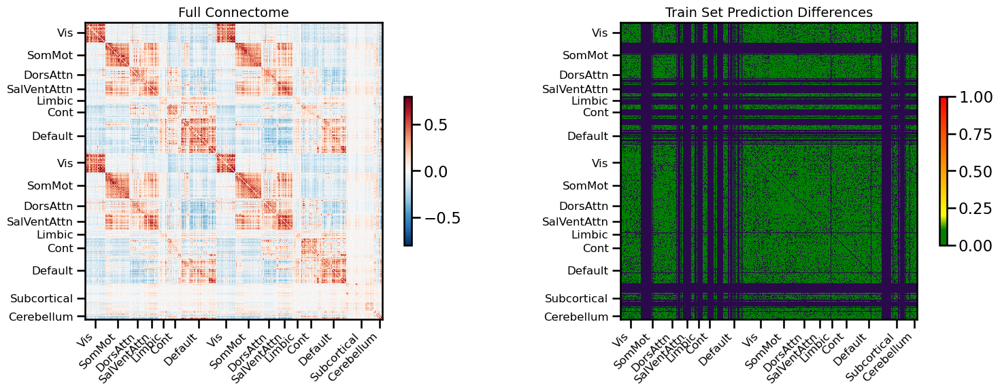

<Figure size 640x480 with 0 Axes>

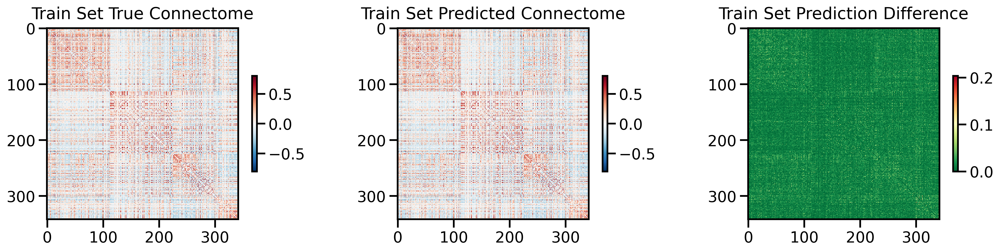

<Figure size 640x480 with 0 Axes>

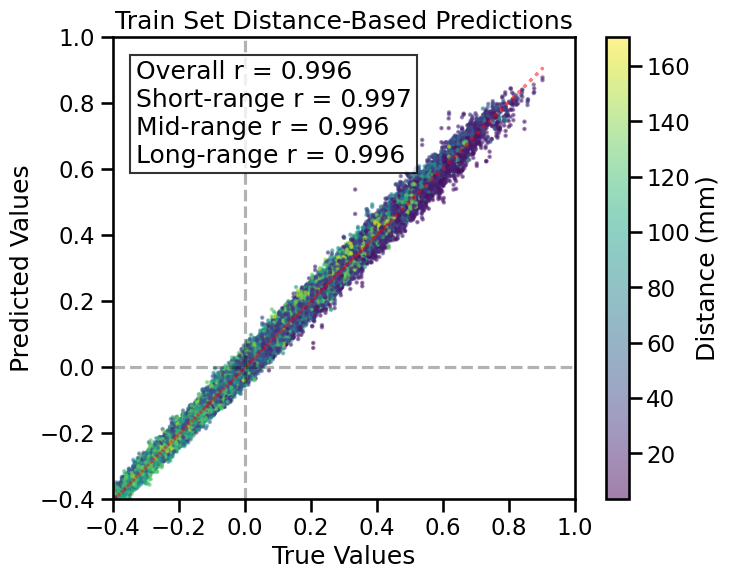

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 113 regions, 12656 connections


<Figure size 640x480 with 0 Axes>

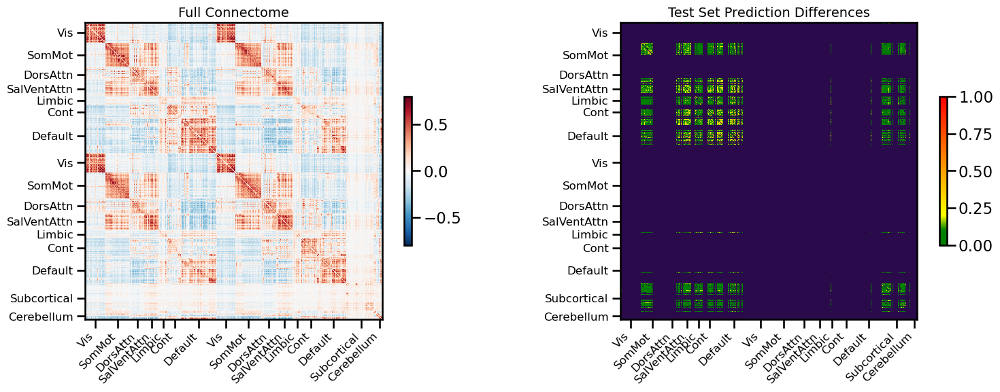

<Figure size 640x480 with 0 Axes>

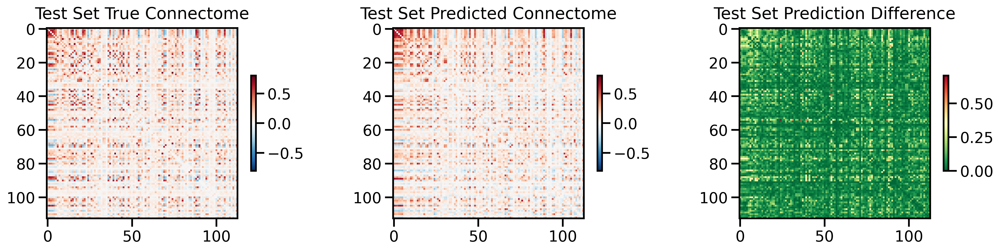

<Figure size 640x480 with 0 Axes>

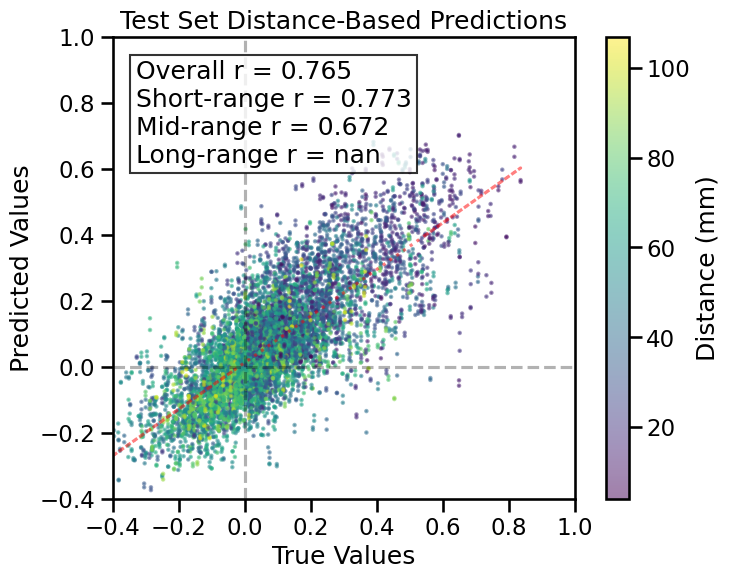

TRAIN METRICS
GLOBAL: mse=0.000290, mae=0.012917, r2=0.9926, pearson_r=0.9965, spearman_r=0.9957, geodesic_distance=9.1421
DISTANCE-BASED: short=0.9966, mid=0.9959, long=0.9956
HEMISPHERIC: left=0.9966, right=0.9964, inter=0.9966
CONNECTION STRENGTH: neg=0.9174, weak=0.9934, pos=0.9760
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.9965    0.9963
  Default       0.9962    0.9963
  SalVentAttn    0.9964    0.9964
  Limbic        0.9961    0.9961
  DorsAttn      0.9962    0.9962
  SomMot        0.9964    0.9964
  Vis           0.9964    0.9963
  Subcortical    0.9962    0.9963
  Cerebellum    0.9978    0.9962

TEST METRICS
GLOBAL: mse=0.011119, mae=0.073950, r2=0.5596, pearson_r=0.7652, spearman_r=0.6939, geodesic_distance=11.8351
DISTANCE-BASED: short=0.7730, mid=0.6719
HEMISPHERIC: left=0.7742, right=0.1941, inter=0.4998
CONNECTION STRENGTH: weak=0.6569, pos=0.3841
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  --------

7363

<Figure size 640x480 with 0 Axes>

In [8]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              train_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='UKBB',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='1',
              cv_type='spatial',
              random_seed=42,
              search_method=('wandb', 'mse', 4),
              track_wandb=False,
              skip_cv=True,
              model_type='shared_transformer_ae',
              use_gpu=True,
              null_model='none',
              use_folds=[0]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()